In [ ]:
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 20.4 MB/s eta 0:00:00



Sorting files in train dataset...

Displaying images with corresponding masks in train dataset...


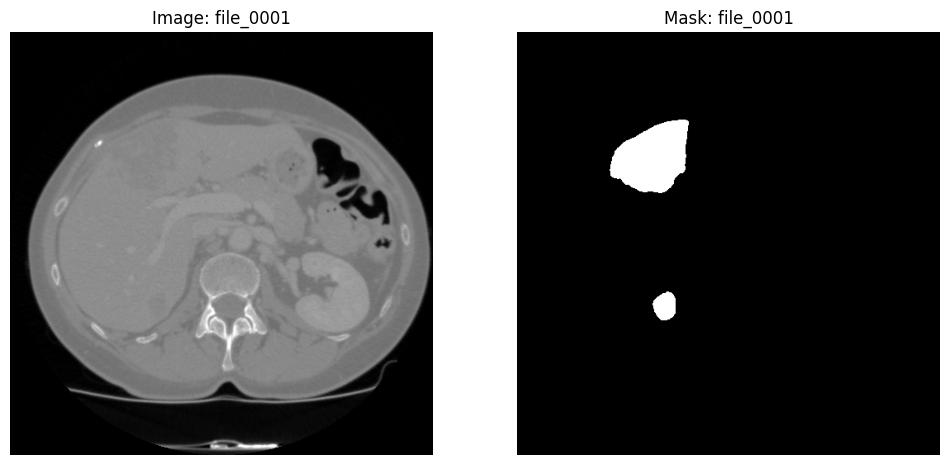

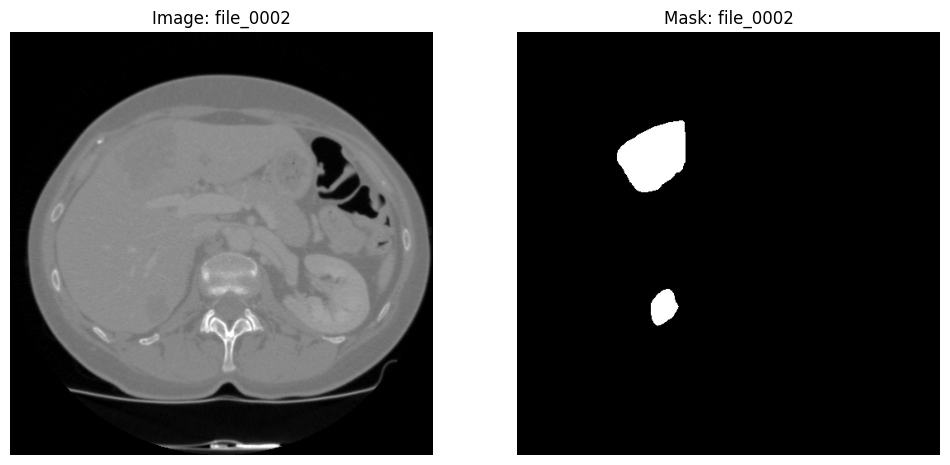

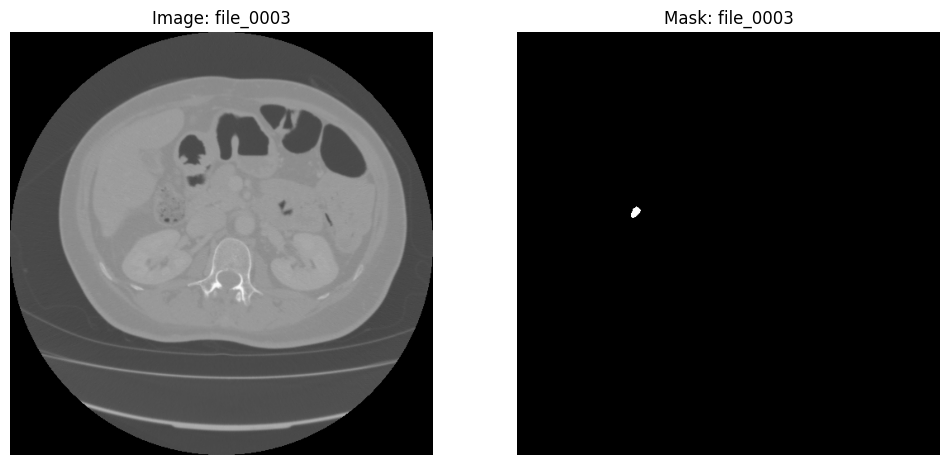

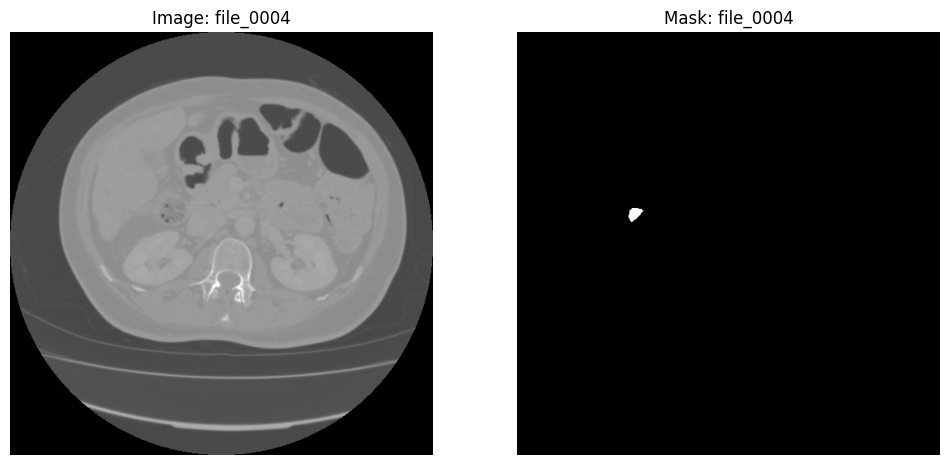

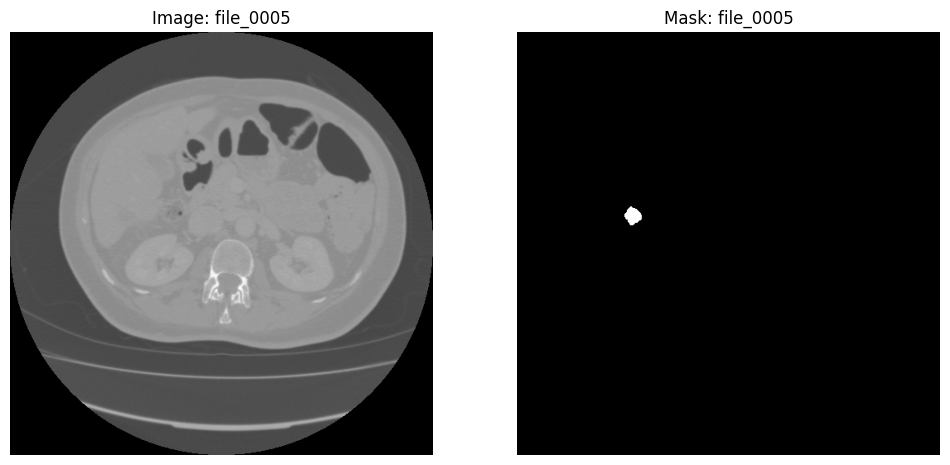

...

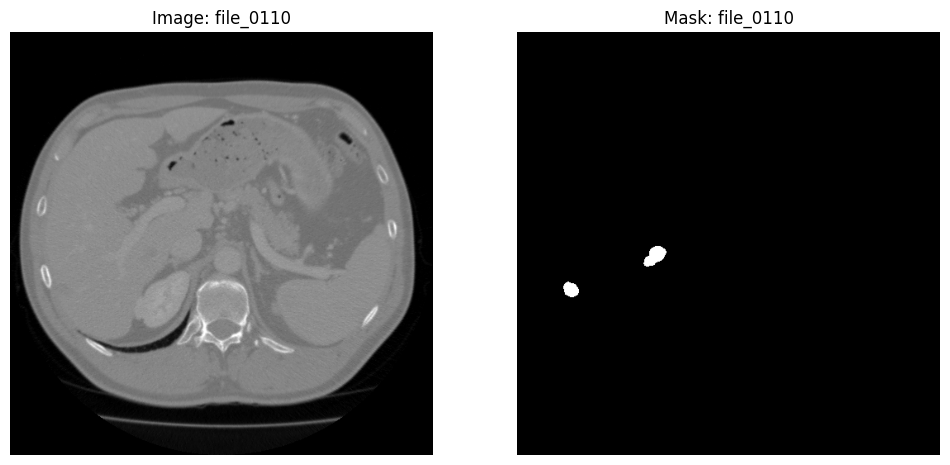

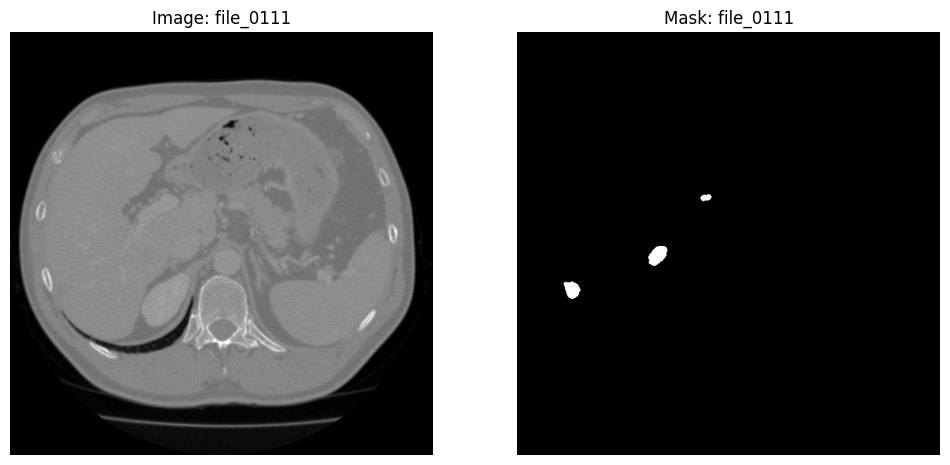

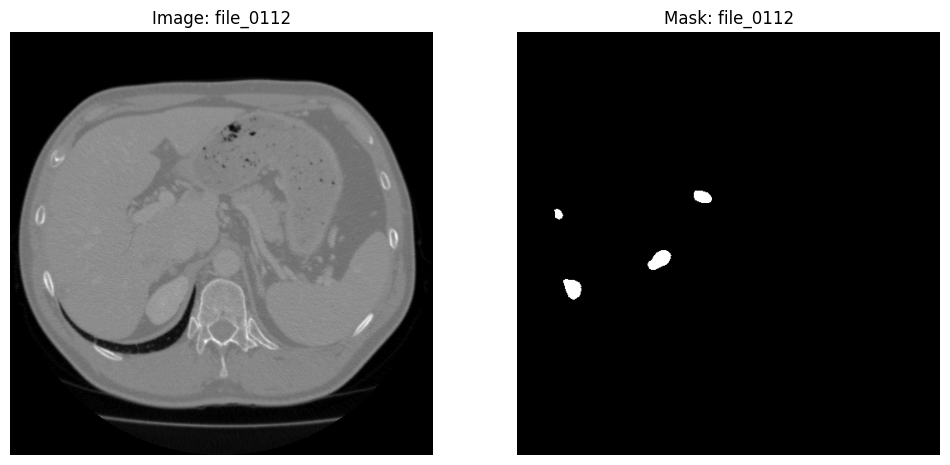

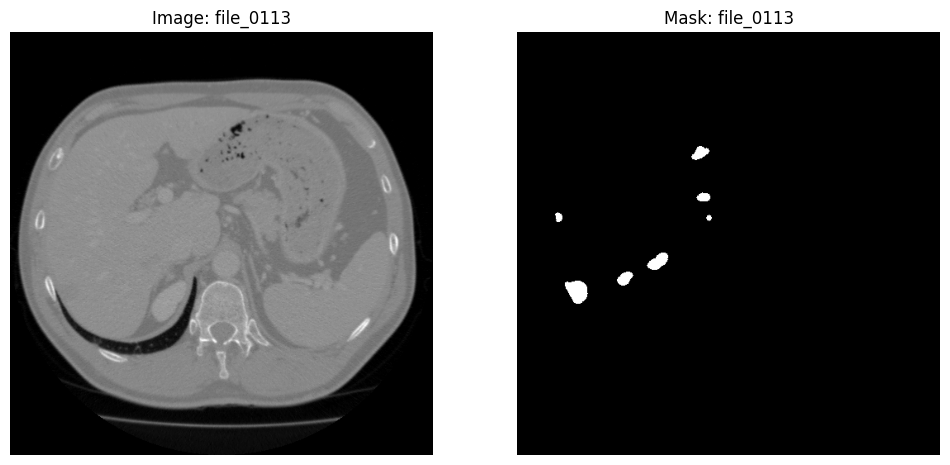

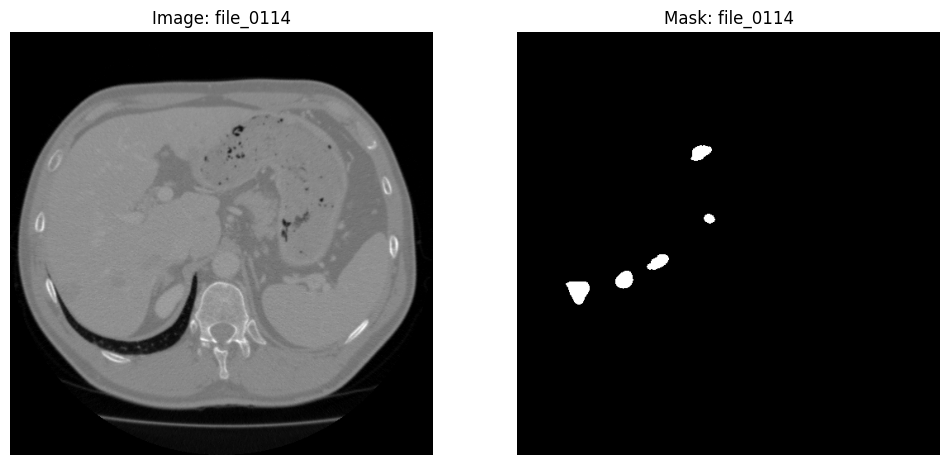

KeyboardInterrupt: 

In [ ]:
import os
import pydicom
import matplotlib.pyplot as plt

# Define the base directory for images and masks
base_image_dir = "/content/drive/MyDrive/split_data"#contain tumor and non tumor slices

base_mask_dir = "/content/drive/MyDrive/split_data"

# Function to sort and rename files in a folder
def sort_and_rename_files(folder_path):
    # Get all the files in the folder
    files = os.listdir(folder_path)

    # Sort the files based on the number in the filenames
    files_sorted = sorted(files, key=lambda x: int(x.split('_')[-1].split('.')[0]))  # Sort based on number in filename

    return files_sorted

# Function to display images and their corresponding masks
def display_images_with_masks(image_folder, mask_folder, image_files, mask_files):
    for image_file, mask_file in zip(image_files, mask_files):
        # Load DICOM images using pydicom
        image_path = os.path.join(image_folder, image_file)
        mask_path = os.path.join(mask_folder, mask_file)

        try:
            # Read the DICOM files
            image_dicom = pydicom.dcmread(image_path)
            mask_dicom = pydicom.dcmread(mask_path)

            # Extract pixel arrays
            image_pixel_array = image_dicom.pixel_array

            mask_pixel_array = mask_dicom.pixel_array

            # Display the image and mask side by side
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            axes[0].imshow(image_pixel_array, cmap='gray')
            axes[0].set_title(f"Image: {image_file}")
            axes[0].axis('off')

            axes[1].imshow(mask_pixel_array, cmap='gray')
            axes[1].set_title(f"Mask: {mask_file}")
            axes[1].axis('off')

            plt.show()

        except Exception as e:
            print(f"Error loading DICOM files {image_file} or {mask_file}: {e}")

# List of dataset types: train, valid, test
dataset_types = ['train', 'valid', 'test']

# Loop over each dataset type to sort files and display images with masks
for dataset in dataset_types:
    image_folder = os.path.join(base_image_dir, dataset, "images")
    mask_folder = os.path.join(base_mask_dir, dataset, "masks")

    # Sort files in the current dataset
    print(f"\nSorting files in {dataset} dataset...")
    image_files_sorted = sort_and_rename_files(image_folder)
    mask_files_sorted = sort_and_rename_files(mask_folder)

    # Display images and their corresponding masks
    print(f"\nDisplaying images with corresponding masks in {dataset} dataset...")
    display_images_with_masks(image_folder, mask_folder, image_files_sorted, mask_files_sorted)

print("✅ Completed displaying images and masks!")


In [ ]:
import os
import numpy as np
import pydicom

# Function to get unique values in images and masks
def unique_values_in_images(image_folder, mask_folder, image_files, mask_files):
    for i, (image_file, mask_file) in enumerate(zip(image_files, mask_files)):
        image_path = os.path.join(image_folder, image_file)
        mask_path = os.path.join(mask_folder, mask_file)

        try:
            # Load image (DICOM or other formats)
            image_pixel_array = pydicom.dcmread(image_path).pixel_array

            # Load mask (DICOM or other formats)
            mask_pixel_array = pydicom.dcmread(mask_path).pixel_array

            # Get unique pixel values
            unique_image_values = np.unique(image_pixel_array)
            unique_mask_values = np.unique(mask_pixel_array)

            print(f"Image {i+1} ({image_file}): Unique Values -> {unique_image_values}")
            print(f"Mask {i+1} ({mask_file}): Unique Values -> {unique_mask_values}")
            print("-" * 50)

        except Exception as e:
            print(f"Error processing {image_file} and {mask_file}: {e}")

# Set folders (update with correct paths)
image_folder = "/content/drive/MyDrive/split_data/train/images"
mask_folder = "/content/drive/MyDrive/split_data/train/masks"

# Get first 5 images and masks (no filtering)
image_files = sorted(os.listdir(image_folder))[:5]
mask_files = sorted(os.listdir(mask_folder))[:5]

# Run the function
unique_values_in_images(image_folder, mask_folder, image_files, mask_files)


Image 1 (file_0001): Unique Values -> [-1024 -1023 -1022 ...  1016  1017  1023]
Mask 1 (file_0001): Unique Values -> [  0 255]
--------------------------------------------------
Image 2 (file_0002): Unique Values -> [-1024 -1023 -1022 ...  1021  1022  1023]
Mask 2 (file_0002): Unique Values -> [  0 255]
--------------------------------------------------
Image 3 (file_0003): Unique Values -> [-2048 -1132 -1129 ...  1442  1470  1472]
Mask 3 (file_0003): Unique Values -> [  0 255]
--------------------------------------------------
Image 4 (file_0004): Unique Values -> [-2048 -1140 -1138 ...  1436  1442  1444]
Mask 4 (file_0004): Unique Values -> [  0 255]
--------------------------------------------------
Image 5 (file_0005): Unique Values -> [-2048 -1150 -1132 ...  1414  1430  1446]
Mask 5 (file_0005): Unique Values -> [  0 255]
--------------------------------------------------


#images are dicom images in Hounsefield unit


In [ ]:
image_size = 128
image_channels = 1
epochs = 30
batch_size = 64


In [ ]:
import os

# Define the paths to your directories
train_img_path = '/content/drive/MyDrive/split_data/train/images'
train_mask_path = '/content/drive/MyDrive/split_data/train/masks'

valid_img_path = '/content/drive/MyDrive/split_data/valid/images'
valid_mask_path = '/content/drive/MyDrive/split_data/valid/masks'

test_img_path = '/content/drive/MyDrive/split_data/test/images'
test_mask_path = '/content/drive/MyDrive/split_data/test/masks'

# Function to get image ids (filenames) from the directory
def get_image_ids(img_path):
    # List all files in the given directory
    return [f for f in os.listdir(img_path)]  # Assuming DICOM files have the .dcm extension

# Create image_ids for training, validation, and testing
train_image_ids = get_image_ids(train_img_path)
valid_image_ids = get_image_ids(valid_img_path)
test_image_ids = get_image_ids(test_img_path)

# Optionally, print the number of image ids to check
print(f"Train images: {len(train_image_ids)}")
print(f"Valid images: {len(valid_image_ids)}")
print(f"Test images: {len(test_image_ids)}")

# You can now pass these image_ids to your ImageDataGen
print(train_image_ids)

Train images: 794
Valid images: 170
Test images: 172
['file_0001', 'file_0002', 'file_0003', 'file_0004', 'file_0005', 'file_0006', 'file_0007', 'file_0008', 'file_0009', 'file_0010', 'file_0011', 'file_0012', 'file_0013', 'file_0014', 'file_0015', 'file_0016', 'file_0017', 'file_0018', 'file_0019', 'file_0020', 'file_0021', 'file_0022', 'file_0023', 'file_0024', 'file_0025', 'file_0026', 'file_0027', 'file_0028', 'file_0029', 'file_0030', 'file_0031', 'file_0032', 'file_0033', 'file_0034', 'file_0035', 'file_0036', 'file_0037', 'file_0038', 'file_0039', 'file_0040', 'file_0041', 'file_0042', 'file_0043', 'file_0044', 'file_0045', 'file_0046', 'file_0047', 'file_0048', 'file_0049', 'file_0050', 'file_0051', 'file_0052', 'file_0053', 'file_0054', 'file_0055', 'file_0056', 'file_0057', 'file_0058', 'file_0059', 'file_0060', 'file_0061', 'file_0062', 'file_0063', 'file_0064', 'file_0065', 'file_0066', 'file_0067', 'file_0068', 'file_0069', 'file_0070', 'file_0071', 'file_0072', 'file_0073